## Chapter 02: logistic-regression Model


### 1. Introduction

Solomon and Wynne conducted an experiment on Dogs in 1953 . They wanted to understand, whether Dogs can learn from mistakes, so to speak. Specifically, they were interested in _avoidance-learning_. That is, when Dogs are given trauma-inducing shocks, will they learn to avoid shocks in future?

We can state the objectives of the expeirment, according to our understanding, in more general terms as follows:

1. Can the Dogs learn?
2. Can they retain & recollect what they learnt?

The experimental setup, to drive the objectives, holds a dog in a closed compartment with steel flooring, open on one side with a small barrier for dog to jump over to the other side. A high-voltage electric shock is discharged into the steel floor intermittently to stimulate the dog. The dog is then left with an option to either get the shock for that trial or jump over the barrier to the other side & save himself. Several dogs were recruited in the experiment.

The following picture ([source](https://commons.wikimedia.org/wiki/File:Shuttle_Box_Dog_Orange.png)) is an illustration of the setup.
<br>
<br>
![dog_setup](./data/avoidance_learning.png)
<br>
<br>
More details of the experiment can be found [here](http://www.appstate.edu/~steelekm/classes/psy5300/Documents/Solomon&Wynne%201953.pdf).

<br>
<br>

In this chapter, we will re-analyze the experimental data using _Bayesian Analysis_, and the inference will be carried out in `Pyro`. 


Recapitulating, we want to model the relationship between __avoidance-in-future__ and __past-traumatic-experiences__ . The following log-linear model is a starting point:
<br>
<br>
$\pi_j   =   A^{xj} B^{j-xj} $
<br>
<br>
where :
   * $\pi_j$ is the probability of a dog getting shocked at trial $j$.
   * $x_j$ is number of successful avoidances of shock prior to trial $j$.
   * $j-x_j$ is number of shocks experienced prior to trial $j$.
   * A & B, both are unknown and treated as random variables.

However, instead of using an `exp` link function as we did in the previous chapter, we will use a `sigmoid` link function. Time for some boilder plate and preliminary EDA.

In [1]:
import torch
import pyro
import pandas as pd
import itertools
from collections import defaultdict
import matplotlib.pyplot as plt
import pyro.distributions as dist
import seaborn as sns
import plotly
import plotly.express as px
import plotly.figure_factory as ff
from chapter02 import base
import numpy as np

pyro.set_rng_seed(10)

plt.style.use('default')

%matplotlib inline
%load_ext autoreload

#### Data
<br>
The data contains experiments over 30 dogs and each dog is subjected to 25 trials.

The plot that follows highlights Dogs data in dictionary format, averaged over dog population for each trial, i.e., $y_j   =   \frac{1}{30}\sum{y_{ij}}$ where $y_{ij}$ is the i-th Dog's response at the j-th trial.

In [2]:

dogs_data = base.load_data()
base.plot_original_y(1-np.mean(dogs_data["Y"], axis=0), ylabel='Probability of shock at trial j', mode_type="lines+markers")


Its apparent from experimental data that more than half the dog population learns to avoid shocks in trials as few as 5, and also that the learning doesn't significantly rise with increased number of trials.

#### Preprocessing
<br>
Next, we need to transform raw data to obtain:

- `x_avoidance` :  number of shock avoidances before current trial.
- `x_shocked` :  number of shocks before current trial.
- `y` : status 'shocked (y=1) or avoided(y=0)' at current trial.

Here `pystan` format [data](https://github.com/stan-dev/example-models/blob/master/bugs_examples/vol1/dogs/dogs.data.R) (python dictionary) is passed to the function above, in order to preprocess it to the tensor format required for pyro sampling.

In [3]:
x_avoidance, x_shocked, y = base.transform_data(**dogs_data)
print("x_avoidance: %s, x_shocked: %s, y: %s"%(x_avoidance.shape, x_shocked.shape, y.shape))
print("\nSample x_avoidance: %s \n\nSample x_shocked: %s"%(x_avoidance[1], x_shocked[1]))

base.plot_original_y(x_avoidance.numpy(), ylabel='Cumulative Avoidances', mode_type="lines+markers")
base.plot_original_y(x_shocked.numpy(), ylabel='Cumulative Shocked Trials', mode_type="lines+markers")

x_avoidance: torch.Size([30, 25]), x_shocked: torch.Size([30, 25]), y: torch.Size([30, 25])

Sample x_avoidance: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 2., 2., 3.]) 

Sample x_shocked: tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 20., 21., 21.])


The original data is not revealing much; looking at the cumulative avoidances and shocks, we see that some dogs never learn (example: Dog 1-4), and some dogs learn and retain the learning behaviour (example: Dog 25-30).

### 2. Model Specification
________
The sampling distrution of the generative model, as indicated earlier, is:
<br>
<br>
$y_{ij}   \sim   Bern(\pi_{ij})$
<br>
$\pi_{ij}   =  \sigma(\alpha x_{ij} + \beta({j-x_{ij}}))$
<br>
<br>
Here, $y_{ij}=1$ if the a dog fails to avoid a shock at the j-th trial, and is 0 if it avoids. Further, $\sigma(x) = \frac{1}{1 - e^{-x}}$, is the usual `sigmoid` function.

We elicit normal priors for $\alpha,\beta$ with zero mean and large variance (flat) to complete the specification. Also notice that, the above model is in a more familiar form (Generalized Linear Model or Log-Linear Model). For convenience, we can define $X_{a}\equiv x_{ij}, X_{s}\equiv j-x_{ij} $
<br>
<br>
The complete model is:
<br>
<br>
$y_{ij} \sim Bern(\pi_{ij})$ 
<br>
$\pi_{ij}  =  \sigma( \alpha X_{a} + \beta X_{s})$  
<br>
$\alpha \sim N(0., 316.)$
<br>
$\beta \sim N(0., 316.)$

Unlike in _chapter 01_ we experiment with the slight variations of the above models as follow:

__Model A.__
<br>
$y_{ij} \sim Bern(\pi_{ij})$
<br>
$\pi_{ij}  =   \sigma (\alpha X_{a} + \beta X_{s})$

$\alpha \sim N(0., 316.)$
<br>
$\beta \sim N(0., 316.)$


__Model B.__
<br>
$y_{ij} \sim Bern(\pi_{ij})$
<br>
$\log(\pi_{ij})  =   \sigma(\alpha X_{a} + \beta X_{s})$

$\alpha \sim U(-30.78, 30.78)$
<br>
$\beta \sim U(-30.78, 30.78)$
<Br>



The above expression is used as a generalised linear model with logisitc-link function in WinBugs implementation

#### Model implementation

The above models are defined in [base.DogsModel](https://github.com/mlsquare/p3/blob/da653f466f89abbfbbbbb2f204b49a3cb49e2319/Part_II/chapter_01/chapter01.py#L70)

In [4]:
DogsModel= base.DogsModel

DogsModel

<function chapter02.base.DogsModel(x_avoidance, x_shocked, y, alpha_prior=None, beta_prior=None, activation='exp')>

Let us also draw few samples from the prior, and look at the distribution

In [5]:
num_samples = 1100 

alpha_prior_a, beta_prior_a= base.init_priors({"default":dist.Normal(0., 316.)})# Pass Normal priors for model A
prior_samples_a = base.get_prior_samples(alpha_prior_a, beta_prior_a, num_samples=num_samples)

alpha_prior_b, beta_prior_b= base.init_priors({"default":dist.Uniform(-30.78,30.78)})# Pass uniform priors for model B
prior_samples_b = base.get_prior_samples(alpha_prior_b, beta_prior_b, num_samples=num_samples)


Sampled output of prior values for $\alpha$ & $\beta$ are stored in `prior_samples` above, and are plotted on a KDE plot as follows:

In [6]:

base.plot_prior_distributions(model_normal_a= prior_samples_a, model_uniform_b= prior_samples_b)


For model 'model_normal_a' Prior alpha Q(0.5) :13.435971736907959 | Prior beta Q(0.5) :22.337939262390137


For model 'model_uniform_b' Prior alpha Q(0.5) :1.1585655212402344 | Prior beta Q(0.5) :0.5592708587646484


### 3. Prior predictive checking

Prior predictive checking (PiPC)

In [7]:

original_plus_simulated_prior_data = base.simulate_observations_given_prior_posterior_pairs(dogs_data["Y"], num_dogs=30, num_trials=24, 
                                                                                            activation_type= "sigmoid", model_normal_a= prior_samples_a, 
                                                                                            model_uniform_b= prior_samples_b)



___________

For model 'model_normal_a' prior
total samples count: 1100  sample example:  [(-190.04013061523438, -319.8582763671875), (-95.51708221435547, -387.94891357421875)]


/Users/tachyon/Desktop/p3/Part_II/Chapter_2/chapter02.py:259: RuntimeWarning:

overflow encountered in exp



Total execution time: 78.11382412910461

Number of datasets/prior pairs generated: 1100
Shape of data simulated from prior for model 'model_normal_a' : (25,)
___________

For model 'model_uniform_b' prior
total samples count: 1100  sample example:  [(-9.30595588684082, 20.834199905395508), (-22.897798538208008, -16.99627113342285)]
Total execution time: 76.54441094398499

Number of datasets/prior pairs generated: 1100
Shape of data simulated from prior for model 'model_uniform_b' : (25,)
Respective shape of original data: (25,) and concatenated arrays of data simulated for different priors/posteriors: (3, 25)

_______________________________________________________
______________________________________________________________________
Here 'Dog_1' corresponds to observations simulated from prior of 'model_normal_a', 'Dog_2' corresponds to observations simulated from prior of 'model_uniform_b' & 'Dog_3' corresponds to 'Original data'.


Even though the mean and median can differ from run to run, looking at the densities, the variance is vary large -- so the sample mean would also have huge variance. The take-away is that, both $\alpha, \beta$ are given very weak priors. We more or less rely on the data (evidence) to drive their estimation.


TBD: Prior Sensitivity Analysis

### 4. Posterior Estimation

In the Bayesian setting, inference is drawn from the posterior.  Here, posterior implies the updated beliefs about the random variables, in the wake of given evidences (data). Formally,
<br>
<br>
$Posterior = \frac {Likelihood x Prior}{Probability \ of Evidence}$
<br>
<br>
In our case, $\alpha,\beta$ are the parameters (actually random variables) & $y$ is the evidence;  According to the Bayes rule, Posterior $P(\alpha,\beta | y)$ is given as:
<br>
<br>
$P\ (\alpha,\beta | y) = \frac {P(y | \alpha,\beta) \pi(\alpha,\beta)}{P(y)}$
<br>
<br>

Now our interest is in estimating the posterior summaries of the parameters $\alpha, \beta$. For example, we can look at the posterior of mean of $\alpha$, denoted as $E(\alpha)$. However, in order to the get the posterior quanitities, either we need to compute the integrals or approximate the integrals via _Markov Chain Monte Carlo_. 

The latter can be easily accomplished in Pyro by using the [NUTS](https://arxiv.org/pdf/1111.4246.pdf) sampler -- NUTS is a specific sampler designed to draw samples efficiently from the posterior using _Hamiltonian Monte Carlo dynamics_.

The following code snippet takes a [pyro](http://pyro.ai/examples/intro_part_i.html) model object with -- posterior specification, input data, some configuration parameters such as a number of chains and number of samples per chain. It then launches a NUTS sampler and produces MCMC samples in a python dictionary format.

In [8]:
# DogsModel_A alpha, beta ~ Normal(0, 316.) & activation "sigmoid"

hmc_sample_chains_a, hmc_chain_diagnostics_a = base.get_hmc_n_chains(DogsModel, x_avoidance, x_shocked, y, 
                                                                     num_chains=4, sample_count = 900, burnin_percentage= 0.2, 
                                                                     alpha_prior= dist.Normal(0., 316.), 
                                                                     beta_prior= dist.Normal(0., 316.), activation= "sigmoid")



Sample: 100%|██████████| 13500/13500 [00:49, 272.89it/s, step size=7.40e-01, acc. prob=0.908]



Total time:  218.51996493339539


In [12]:
# DogsModel_1B alpha, beta ~ Uniform(-30.78,30.78) & activation "sigmoid"

hmc_sample_chains_b, hmc_chain_diagnostics_b = base.get_hmc_n_chains(DogsModel, x_avoidance, x_shocked, y, 
                                                                     num_chains=4, sample_count = 900, burnin_percentage= 0.4,
                                                                     alpha_prior= dist.Uniform(-30.78,30.78), 
                                                                     beta_prior= dist.Normal(-30.78, 30.78), activation= "sigmoid")



Sample: 100%|██████████| 21000/21000 [4:45:51,  1.22it/s, step size=5.25e-01, acc. prob=0.925] 



Total time:  18536.32725596428


`hmc_sample_chains` holds sampled MCMC values as `{"Chain_0": {alpha	[-0.20020795, -0.1829252, -0.18054989 . .,], "beta": {}. .,}, "Chain_1": {alpha	[-0.20020795, -0.1829252, -0.18054989 . .,], "beta": {}. .,}. .}`

### 5. MCMC Diagnostics
Diagnosing the computational approximation

Just like any numerical technique, no matter how good the theory is or how robust the implementation is, it is always a good idea to check if indeed the samples drawn are reasonable. In the ideal situation, we expect the samples drawn by the sampler to be independant, and identically distributed (i.i.d) as the posterior distribution. In practice, this is far from true as MCMC itself is an approximate technique and a lot can go wrong. In particular, chains may not have converged or samples are very correlated. We can divide diagnosis into three sections.

- __Burn-in__: What is the effect of initialization? By visually inspecting the chains, we can notice the transient behaviour. We can drop the first "n" number of samples from the chain.

- __Thinning__: What is the intra chain correlation? We can use ACF (Auto-correlation function) to inspect it. A rule of thumb is, thin the chains such that, the ACF drops to $1/10^{th}$. Here, ACF drops to less than 0.1 at lag 5, then we retain only every $5^{th}$ sample in the chain.

- __Mixing__: Visually, all the chains, when plotted, should be indistinguishable from each other. At a very broad level, the means of the chains and variances shall be close. These are the two central moments we can track easily and turn them into Gelman-Rubin statistic. Other summmary statistics can be tracked, of course. 

We can use both visual and more formal statistical techniques to inspect the quality of the fit (not the model fit to the data, but how well the approximation is, having accepted the model class for the data at hand) by  treating chains as time-series data, and that we can run several chains in parallel. We precisely do that next. 

Following snippet allows plotting **Parameter vs. Chain matrix** and optionally saving the dataframe.

#### Model-A Summaries

In [13]:
# Unpruned sample chains for model A with Normal prior
beta_chain_matrix_df_A = pd.DataFrame(hmc_sample_chains_a)

base.save_parameter_chain_dataframe(beta_chain_matrix_df_A, "data/dogs_parameter_chain_matrix_2A.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_parameter_chain_matrix_2A.csv'


##### A.1 Visual summary

###### A.1.1 Intermixing chains 
Sample chains mixing for `Normal` priors.

Following plots chains of samples for alpha & beta parameters for `model_normal_a`

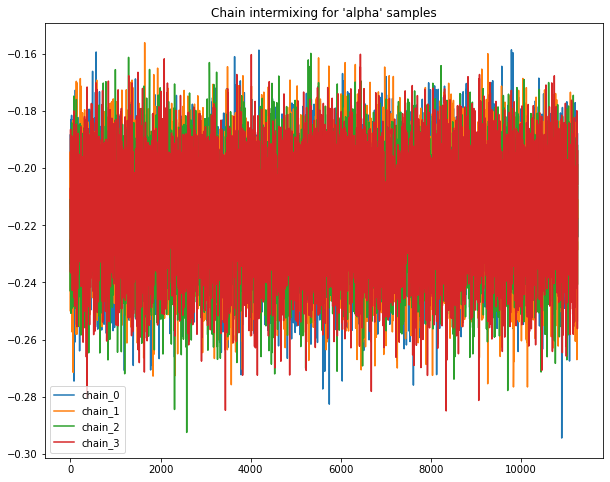

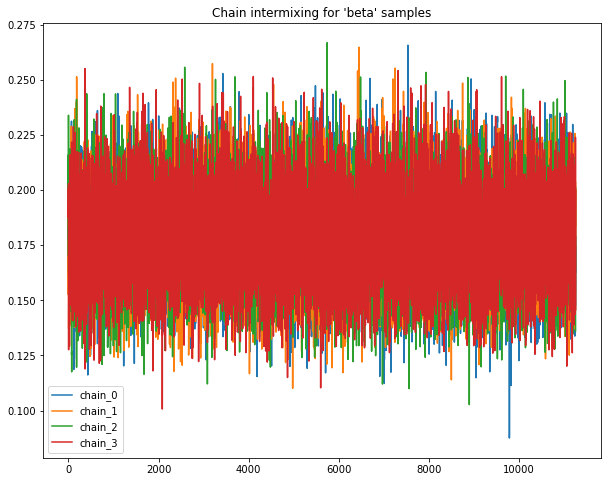

____
For model_Normal_a chain_0
chain_0 Sample count:  11250
Alpha Q(0.5) :tensor(-0.2158) | Beta Q(0.5) :tensor(0.1790)
____
For model_Normal_a chain_1
chain_1 Sample count:  11250
Alpha Q(0.5) :tensor(-0.2158) | Beta Q(0.5) :tensor(0.1792)
____
For model_Normal_a chain_2
chain_2 Sample count:  11250
Alpha Q(0.5) :tensor(-0.2151) | Beta Q(0.5) :tensor(0.1784)
____
For model_Normal_a chain_3
chain_3 Sample count:  11250
Alpha Q(0.5) :tensor(-0.2153) | Beta Q(0.5) :tensor(0.1790)


In [14]:

base.plot_chains(beta_chain_matrix_df_A)

for chain, samples in hmc_sample_chains_a.items():
    print("____\nFor model_Normal_a %s"%chain)    
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))
    print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))


##### A.2 Quantitative summary

###### A.2.1 ACF plots
Auto-correlation plots for sample chains with `Normal` priors

In [15]:

base.autocorrelation_plots(beta_chain_matrix_df_A)


RadioButtons(description='Parameters:', options=('alpha', 'beta'), value='alpha')

SelectMultiple(description='Select Chains', index=(3,), options=('chain_0', 'chain_1', 'chain_2', 'chain_3'), …

Output()

For `alpha`, `thining factor` for `chain_0` is 7, `chain_1` is 7, `chain_2` is 7, `chain_3` is 7

for `beta`, `thinin factor` for `chain_0` is 7, `chain_1` is 7, `chain_2` is 7, `chain_3` is 7



Pruning chains from model with `Normal` priors

In [16]:
thining_dict_a = {"chain_0": {"alpha":7, "beta":7}, "chain_1": {"alpha":7, "beta":7}, 
                "chain_2": {"alpha":7, "beta":7}, "chain_3": {"alpha":7, "beta":7}}

pruned_hmc_sample_chains_a = base.prune_hmc_samples(hmc_sample_chains_a, thining_dict_a)


-------------------------
Original sample counts for 'chain_0' parameters: {'alpha': (11250,), 'beta': (11250,)}

Thining factors for 'chain_0' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_0' parameters: {'alpha': (1607,), 'beta': (1607,)}


-------------------------
Original sample counts for 'chain_1' parameters: {'alpha': (11250,), 'beta': (11250,)}

Thining factors for 'chain_1' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_1' parameters: {'alpha': (1607,), 'beta': (1607,)}


-------------------------
Original sample counts for 'chain_2' parameters: {'alpha': (11250,), 'beta': (11250,)}

Thining factors for 'chain_2' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_2' parameters: {'alpha': (1607,), 'beta': (1607,)}


-------------------------
Original sample counts for 'chain_3' parameters: {'alpha': (11250,), 'beta': (11250,)}

Thining factors for 'chain_3' parameters: {'alpha': 7, 'beta': 7} 
Pos

###### A.2.2 G-R statistic
Gelman-Rubin statistic for chains with `Normal` priors

In [17]:

grubin_values_a = base.gelman_rubin_stats(pruned_hmc_sample_chains_a)



Gelmen-rubin for 'param' alpha all chains is: 0.9997

Gelmen-rubin for 'param' beta all chains is: 0.9995


##### A.3 Descriptive summary

Following outputs the summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, select names of statistic metric from given list to view values.

###### A.3.1 Summary Table 1
Tabulated Summary for model chains with `Normal` priors

In [18]:
#chain results Pruned after ACF plots

beta_chain_matrix_df_A = pd.DataFrame(pruned_hmc_sample_chains_a)

base.summary(beta_chain_matrix_df_A)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

We can also report the 5-point Summary Statistics (mean, Q1-Q4, Std, ) as tabular data per chain and save the dataframe

In [19]:
fit_df_A = pd.DataFrame()
for chain, values in pruned_hmc_sample_chains_a.items():
    param_df = pd.DataFrame(values)
    param_df["chain"]= chain
    fit_df_A= pd.concat([fit_df_A, param_df], axis=0)

base.save_parameter_chain_dataframe(fit_df_A, "data/dogs_classification_hmc_samples_2A.csv")

Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_classification_hmc_samples_2A.csv'


Use following button to upload:

* `"data/dogs_classification_hmc_samples_2A.csv"` as `'fit_df_A'`


In [20]:
# Use following to load data once the results from pyro sampling operation are saved offline
load_button= base.build_upload_button()

FileUpload(value={}, accept='.csv', button_style='info', description='Upload')

In [21]:
# Use following to load data once the results from pyro sampling operation are saved offline

if load_button.value:
    fit_df_A = base.load_parameter_chain_dataframe(load_button)#Load "data/dogs_classification_hmc_samples_2A.csv"
    

###### A.3.2 Summary Table 2
5-point Summary Statistics for model chains with `Normal` priors

Following outputs the similar summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, but in a slightly different format, given a list of statistic names

In [22]:

base.summary(fit_df_A, layout =2)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

Following plots sampled parameters values as Boxplots with `M parameters` side by side on x axis for each of the `N chains`.

Pass the list of `M parameters` and list of `N chains`, with `plot_interactive` as `True or False` to choose between _Plotly_ or _Seaborn_

##### A.4 Additional plots

###### A.4.1 Boxplots
Boxplot for model chains with `Normal` priors

In [23]:
parameters= ["alpha", "beta"]# All parameters for given model
chains= fit_df_A["chain"].unique()# Number of chains sampled for given model


In [24]:
# Use plot_interactive=False for Normal seaborn plots offline

base.plot_parameters_for_n_chains(fit_df_A, chains=['chain_0', 'chain_1', 'chain_2', 'chain_3'], parameters=parameters, plot_interactive=True)



###### A.4.2 Joint distribution plots
Following plots the `joint distribution` of `pair of each parameter` sampled values for all chains with `Normal` priors.


Pyro -- alpha Vs. beta


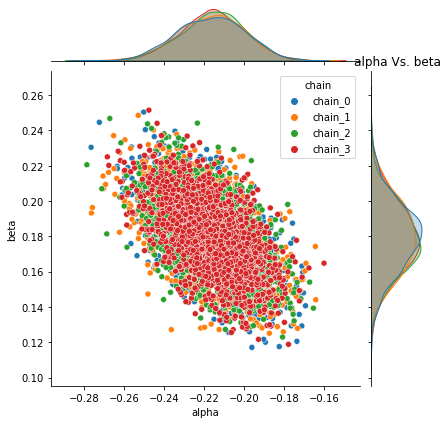

In [25]:

base.plot_joint_distribution(fit_df_A, parameters)
# # 

###### A.4.3 Pairplots
Following plots the `Pairplot distribution` of each parameter with every other parameter's sampled values for all chains with `Normal` priors

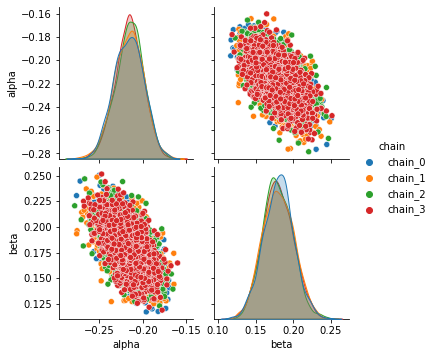

In [26]:
sns.pairplot(data=fit_df_A, hue= "chain");

#### Model-B Summaries

In [27]:
# Unpruned sample chains for model B with Uniform prior
beta_chain_matrix_df_B = pd.DataFrame(hmc_sample_chains_b)

base.save_parameter_chain_dataframe(beta_chain_matrix_df_B, "data/dogs_parameter_chain_matrix_2B.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_parameter_chain_matrix_2B.csv'


##### B.1 Visual summary

###### B.1.1 Intermixing chains 
Sample chains mixing for `Uniform` priors.

Following plots chains of samples for alpha & beta parameters for `model_Uniform_b`

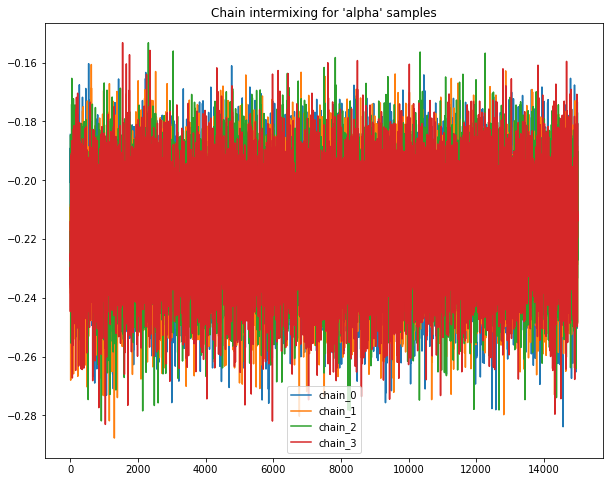

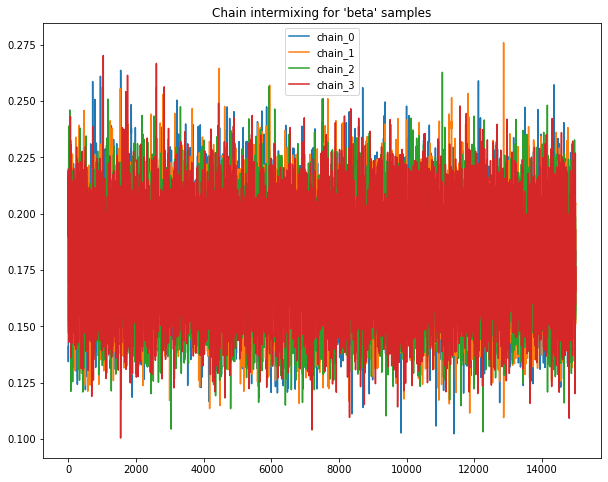

____
For model_Uniform_b chain_0
chain_0 Sample count:  15000
Alpha Q(0.5) :tensor(-0.2157) | Beta Q(0.5) :tensor(0.1790)
____
For model_Uniform_b chain_1
chain_1 Sample count:  15000
Alpha Q(0.5) :tensor(-0.2155) | Beta Q(0.5) :tensor(0.1788)
____
For model_Uniform_b chain_2
chain_2 Sample count:  15000
Alpha Q(0.5) :tensor(-0.2155) | Beta Q(0.5) :tensor(0.1785)
____
For model_Uniform_b chain_3
chain_3 Sample count:  15000
Alpha Q(0.5) :tensor(-0.2157) | Beta Q(0.5) :tensor(0.1798)


In [28]:
base.plot_chains(beta_chain_matrix_df_B)

for chain, samples in hmc_sample_chains_b.items():
    print("____\nFor model_Uniform_b %s"%chain)    
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))
    print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))


##### B.2 Quantitative summary

###### B.2.1 ACF plots
Auto-correlation plots for sample chains with `Uniform` priors

In [29]:

base.autocorrelation_plots(beta_chain_matrix_df_B)


RadioButtons(description='Parameters:', options=('alpha', 'beta'), value='alpha')

SelectMultiple(description='Select Chains', index=(0,), options=('chain_0', 'chain_1', 'chain_2', 'chain_3'), …

Output()

For `alpha`, `thining factor` for `chain_0` is 7, `chain_1` is 7, `chain_2` is 7, `chain_3` is 7

for `beta`, `thinin factor` for `chain_0` is 7, `chain_1` is 7, `chain_2` is 7, `chain_3` is 7



Pruning chains from model with `Uniform` priors

In [30]:
thining_dict_b = {"chain_0": {"alpha":7, "beta":7}, "chain_1": {"alpha":7, "beta":7}, 
                "chain_2": {"alpha":7, "beta":7}, "chain_3": {"alpha":7, "beta":7}}

pruned_hmc_sample_chains_b = base.prune_hmc_samples(hmc_sample_chains_b, thining_dict_b)


-------------------------
Original sample counts for 'chain_0' parameters: {'alpha': (15000,), 'beta': (15000,)}

Thining factors for 'chain_0' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_0' parameters: {'alpha': (2143,), 'beta': (2143,)}


-------------------------
Original sample counts for 'chain_1' parameters: {'alpha': (15000,), 'beta': (15000,)}

Thining factors for 'chain_1' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_1' parameters: {'alpha': (2143,), 'beta': (2143,)}


-------------------------
Original sample counts for 'chain_2' parameters: {'alpha': (15000,), 'beta': (15000,)}

Thining factors for 'chain_2' parameters: {'alpha': 7, 'beta': 7} 
Post thining sample counts for 'chain_2' parameters: {'alpha': (2143,), 'beta': (2143,)}


-------------------------
Original sample counts for 'chain_3' parameters: {'alpha': (15000,), 'beta': (15000,)}

Thining factors for 'chain_3' parameters: {'alpha': 7, 'beta': 7} 
Pos

###### B.2.2 G-R statistic

Gelman-Rubin statistic for chains with `Uniform` priors

In [31]:

grubin_values_b = base.gelman_rubin_stats(pruned_hmc_sample_chains_b)



Gelmen-rubin for 'param' alpha all chains is: 0.9996

Gelmen-rubin for 'param' beta all chains is: 0.9996


##### B.3 Descriptive summary

Following outputs the summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, select names of statistic metric from given list to view values

###### B.3.1 Summary Table 1
Tabulated Summary for model chains with `Uniform` priors

In [32]:
#chain results Pruned after ACF plots

beta_chain_matrix_df_B = pd.DataFrame(pruned_hmc_sample_chains_b)

base.summary(beta_chain_matrix_df_B)


SelectionSlider(continuous_update=False, description='Slide to', options=('View 1', 'View 2', 'Clear'), value=…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

We can also report the 5-point Summary Statistics (mean, Q1-Q4, Std, ) as tabular data per chain and save the dataframe

In [33]:
fit_df_B = pd.DataFrame()
for chain, values in pruned_hmc_sample_chains_b.items():
    param_df = pd.DataFrame(values)
    param_df["chain"]= chain
    fit_df_B= pd.concat([fit_df_B, param_df], axis=0)

base.save_parameter_chain_dataframe(fit_df_B, "data/dogs_classification_hmc_samples_2B.csv")

Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_classification_hmc_samples_2B.csv'


Use following button to upload:
* `"data/dogs_classification_hmc_samples_2B.csv"` as `'fit_df_B'`

In [34]:
# Use following to load data once the results from pyro sampling operation are saved offline
load_button= base.build_upload_button()

FileUpload(value={}, accept='.csv', button_style='info', description='Upload')

In [35]:
# Use following to load data once the results from pyro sampling operation are saved offline

if load_button.value:
    fit_df_B= base.load_parameter_chain_dataframe(load_button)#Load "data/dogs_classification_hmc_samples_2B.csv"

###### B.3.2 Summary Table 2
5-point Summary Statistics for model chains with `Uniform` priors

Following outputs the similar summary of required statistics such as `"mean", "std", "Q(0.25)", "Q(0.50)", "Q(0.75)"`, but in a slightly different format, given a list of statistic names

In [36]:

base.summary(fit_df_B, layout =2)


SelectionSlider(continuous_update=False, description='Slide to', index=2, options=('View 1', 'View 2', 'Clear'…

Select any value


Dropdown(options=('mean', 'std', '25%', '50%', '75%', 'ALL'), value='mean')

Output()

Following plots sampled parameters values as Boxplots with `M parameters` side by side on x axis for each of the `N chains`.

Pass the list of `M parameters` and list of `N chains`, with `plot_interactive` as `True or False` to choose between _Plotly_ or _Seaborn_

##### B.4 Additional plots

###### B.4.1 Boxplots
Boxplot for model chains with `Uniform` priors

In [37]:
parameters= ["alpha", "beta"]# All parameters for given model
chains= fit_df_B["chain"].unique()# Number of chains sampled for given model

In [38]:
# Use plot_interactive=False for Normal seaborn plots offline

base.plot_parameters_for_n_chains(fit_df_B, chains=['chain_0', 'chain_1', 'chain_2', 'chain_3'], parameters=parameters, plot_interactive=True)



###### B.4.2 Joint distribution plots
Following plots the `joint distribution` of `pair of each parameter` sampled values for all chains with `Uniform` priors.


Pyro -- alpha Vs. beta


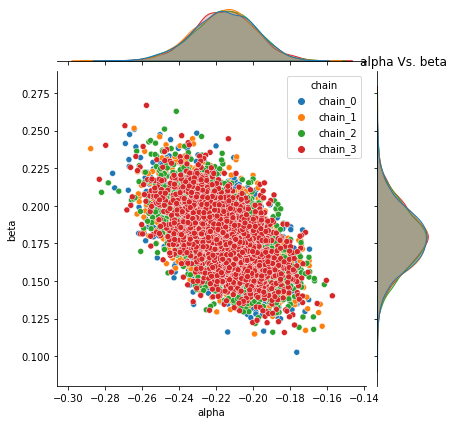

In [39]:

base.plot_joint_distribution(fit_df_B, parameters)


###### B.4.3 Pairplots
Following plots the `Pairplot distribution` of each parameter with every other parameter's sampled values for all chains with `Uniform` priors

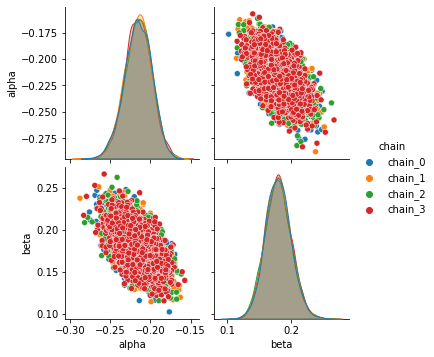

In [40]:
sns.pairplot(data=fit_df_B, hue= "chain");

#### Combined KDE plots
Kernel density plots for `model_Normal_a` & `model_Uniform_b`

In [41]:
for chain in hmc_sample_chains_a.keys():
    print("____\nFor 'model_Normal_a' & 'model_Uniform_b' %s"%chain)
    chain_list= list(hmc_sample_chains_a[chain].values())
    chain_list.extend(list(hmc_sample_chains_b[chain].values()))
    title= "parameter distribution for : %s"%(chain)
    fig = ff.create_distplot(chain_list, ["alpha_a", "beta_a", "alpha_b", "beta_b"])
    fig.update_layout(title=title, xaxis_title="parameter values", yaxis_title="density", legend_title="parameters")
    fig.show()
    break

____
For 'model_Normal_a' & 'model_Uniform_b' chain_0


#### Statsmodel logistic-regression
Fit a `statsmodel` logistic regression for $\pi_{ij}$ as another alternate reference model to obtain the estimates of $\alpha\ and\ \beta $ in frequentist paradigm.

In [42]:
data_df= pd.DataFrame({"avoided":np.sum(dogs_data["Y"], axis=1), "shocks":dogs_data["Ntrials"]- np.sum(dogs_data["Y"], axis=1)})
data_df["Pij"]= np.round(1-np.mean(dogs_data["Y"], axis=1))
data_df.head(5)

,avoided,shocks,Pij
0,0,25,1.0
1,3,22,1.0
2,2,23,1.0
3,2,23,1.0
4,6,19,1.0


In [43]:
import statsmodels.api as sm
Xtrain= data_df[["avoided", "shocks"]]
ytrain= data_df[["Pij"]]
# log_reg = sm.Logit(ytrain, Xtrain).fit()

The above fit `sm.Logit(ytrain, Xtrain).fit()` outputs -
__PerfectSeparationError: Perfect separation detected, results not available__.

It imples that there is no unique alpha-beta pair that fits the data; Infact there are infinite plausible pairs of alpha, beta parameters which can be decisive in parting data along the lines of 'shocked vs. avoided'.

Nothing unusual seems to be happening. 

- All chains are mixing well (G-R statistics are close to 1). 
- ACF of the chains decay rapidly.
- Both `Normal` and `Uniform` are giving similar results
- Joint distribution of $\alpha, \beta$ has no strong correlation, and are consistent across chains.

But, let us do Posterior Predictive checks

### 6. Sensitivity Analysis

Posterior Predictive Checking (PoPC) helps examine the fit of a model to real data. The simulation parameters come from the posterior distribution. While `PoPC` incorporates model uncertainly (by averaging over all possible models), we take a simpler route to begin with, which is to sample the $\alpha, \beta$ pairs that are very plausible in the posterior (eg. the posterior means), and simulate data under this particular generative model.

In particular, just like the `PiPC` (Prior Predictive Check), we are intereted in the posterior expected value of a Dog getting shocked. This quantity can be estimated by the Monte Carlo average:

$$\begin{equation}
E_{P(\alpha,\beta|y_j)}[\hat{y}] = E_{P(\alpha,\beta|y_j)}[S(\alpha X_{a} + \beta X_{s})]
\end{equation}$$

$$
\,\,\,\, \approx   \frac{1}{T}\sum_{t=1}^{T}S(\alpha_t X_{a} + \beta_t X_{s})
$$


where $\alpha_t, \beta_t$ are the t-th posterior samples in the MCMC chain.

In [44]:
# With priors & posteriros
posterior_parameters_pairs_a = pruned_hmc_sample_chains_a.get('chain_0')

posterior_parameters_pairs_b = pruned_hmc_sample_chains_b.get('chain_0')

original_plus_simulated_data_posterior = base.simulate_observations_given_prior_posterior_pairs(dogs_data["Y"], 
                                                                                                num_dogs=30, num_trials=24, activation_type= "sigmoid", 
                                                                                                prior_simulations= original_plus_simulated_prior_data, 
                                                                                                model_normal_a= posterior_parameters_pairs_a,
                                                                                                model_uniform_b= posterior_parameters_pairs_b)


___________

For model 'model_normal_a' posterior
total samples count: 1607  sample example:  [(-0.20771554, 0.16250883), (-0.1965488, 0.18346697)]
Total execution time: 110.77076888084412

Number of datasets/posterior pairs generated: 1607
Shape of data simulated from posterior for model 'model_normal_a' : (25,)
___________

For model 'model_uniform_b' posterior
total samples count: 2143  sample example:  [(-0.18443489, 0.1410535), (-0.2114582, 0.1672326)]
Total execution time: 950.3785030841827

Number of datasets/posterior pairs generated: 2143
Shape of data simulated from posterior for model 'model_uniform_b' : (25,)
Respective shape of original data: (25,) and concatenated arrays of data simulated for different priors/posteriors: (5, 25)

_______________________________________________________
______________________________________________________________________
Here 'Dog_1' corresponds to observations simulated from posterior of 'model_normal_a', 'Dog_2' corresponds to observati

Observation: 

From the Posterior predictive plots, it is evident that model estimates stay at around 0.5 and largely indecisive to answer if the dogs learn or not. Since we used `sigmoid` link function this time, the possible reason for the observed behaviour could be due to stark similarity between values of $\alpha$ & $\beta$, just with one of them being equally negative. In effect, both cancel the effect of each other, $\sigma(0)=0.5$.

Also with the current specification of link function and prior distribution it seems the posterior estimates may converge after excessively large number of trials (what if we have collected, not 25 but 100 trials).

Save simulated data from `prior & posterior predictive checking`

In [45]:
original_plus_simulated_data_posterior_df= pd.DataFrame(original_plus_simulated_data_posterior.T, 
                                                     columns=["Dog_%s"%(idx+1) for idx in range(len(original_plus_simulated_data_posterior))])


base.save_parameter_chain_dataframe(original_plus_simulated_data_posterior_df, 
                                    "data/dogs_original_plus_simulated_data_model_2ab.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_original_plus_simulated_data_model_2ab.csv'


Compare existing models model_Normal_A & model_Uniform_B with models 1A & 1B from _chapter 01_.

In [47]:
# Load data from PiPC & PoPC for model_1A & 1B simulations

load_button= base.build_upload_button()


FileUpload(value={}, accept='.csv', button_style='info', description='Upload')

In [48]:
# Load data from PiPC & PoPC for model_1A & 1B simulations

if load_button.value:
    original_plus_simulated_data_posterior_model_1_df = base.load_parameter_chain_dataframe(load_button)#Load "../chapter_01/data/dogs_original_plus_simulated_data_model_1ab.csv"
else:
    original_plus_simulated_data_posterior_model_1_df = pd.read_csv("../chapter_01/data/dogs_original_plus_simulated_data_model_1ab.csv")



In [49]:
original_plus_simulated_data_posterior_model_1 = original_plus_simulated_data_posterior_model_1_df.values.T

combined_original_plus_simulated_data_model_1_2 = np.concatenate([original_plus_simulated_data_posterior[:-1], original_plus_simulated_data_posterior_model_1])

# Uncomment following & run this cell to load the "combined_original_plus_simulated_data_model_1_2" in case loss of state

# combined_original_plus_simulated_data_model_1_2 = pd.read_csv("data/dogs_original_plus_simulated_data_model_1ab_2ab_combined.csv").values.T

print("Shape of model 1 & 2 combined array: ", combined_original_plus_simulated_data_model_1_2.shape)

ylabel_text= 'Probability of shock at trial j [original & priors, posteriors]'

print("\n\nHere\n'Dog_1': observations from 'model_normal_a Posterior'.\n'Dog_2' : observations from 'model_uniform_b Posterior'.\
\n'Dog_3': observations from 'model_normal_a Prior'.\n'Dog_4': observations from 'model_uniform_b Prior'\n%s"%("_"*55))

print("\nHere\n'Dog_5': observations from 'model_HalfNormal_1a Posterior'. \n'Dog_6' : observations from 'model_uniform_1b Posterior'.\
\n'Dog_7' : observations from 'model_HalfNormal_1a Prior'. \n'Dog_8' : observations from 'model_uniform_1b Prior'.\
\n\n'Dog_9': observations from 'Original data'.")

base.plot_original_y(combined_original_plus_simulated_data_model_1_2, ylabel=ylabel_text, mode_type="lines+markers")


Shape of model 1 & 2 combined array:  (9, 25)


Here
'Dog_1': observations from 'model_normal_a Posterior'.
'Dog_2' : observations from 'model_uniform_b Posterior'.
'Dog_3': observations from 'model_normal_a Prior'.
'Dog_4': observations from 'model_uniform_b Prior'
_______________________________________________________

Here
'Dog_5': observations from 'model_HalfNormal_1a Posterior'. 
'Dog_6' : observations from 'model_uniform_1b Posterior'.
'Dog_7' : observations from 'model_HalfNormal_1a Prior'. 
'Dog_8' : observations from 'model_uniform_1b Prior'.

'Dog_9': observations from 'Original data'.


In [50]:
combined_original_plus_simulated_data_model_1_2_df= pd.DataFrame(combined_original_plus_simulated_data_model_1_2.T, 
                                                     columns=["Dog_%s"%(idx+1) for idx in range(len(combined_original_plus_simulated_data_model_1_2))])


base.save_parameter_chain_dataframe(combined_original_plus_simulated_data_model_1_2_df, 
                                    "data/dogs_original_plus_simulated_data_model_1ab_2ab_combined.csv")


Button(button_style='info', description='Save', icon='save', style=ButtonStyle(), tooltip='save')

Saved at 'data/dogs_original_plus_simulated_data_model_1ab_2ab_combined.csv'


### 7. Model Comparison

More often than not, there may be many plausible models that can explain the data. Sometime, the modeling choice is based on _domain knowledge_. Sometime it is out of comptational conveninece. Latter is the case with the choice of priors. One way to consider different models is by eliciting different prior distributions. 

As long as the sampling distribtion is same, one can use Deviance Information Criterion (DIC) to guide model comparison.

#### DIC
DIC(Deviance Information Criterion) is computed as follows
<Br>

$D(\alpha,\beta) = -2\ \sum_{i=1}^{n} \log P\ (y_{i}\ /\ \alpha,\beta)$

$\log P\ (y_{i}\ /\ \alpha,\beta)$ is the log likehood of shocks/avoidances observed given parameter $\alpha,\beta$, this expression expands as follows:

<Br>
Using $D(\alpha,\beta)$ to Compute DIC
<Br>

$\overline D(\alpha,\beta) = \frac{1}{T} \sum_{t=1}^{T} D(\alpha,\beta)$

$\overline \alpha = \frac{1}{T} \sum_{t=1}^{T}\alpha_{t}\\$
$\overline \beta = \frac{1}{T} \sum_{t=1}^{T}\beta_{t}$


Therefore finally


$$\begin{equation}
DIC\ =\ 2\ \overline D(\alpha,\beta)\ -\ D(\overline\alpha,\overline\beta)
\end{equation}$$


<Br>
Following method computes deviance value given parameters `alpha & beta`
<Br>

In [51]:
#launch docstring for calculate_deviance_given_param

#launch docstring for calculate_mean_deviance


<Br>

Following method computes `deviance information criterion` for a given bayesian model & chains of sampled parameters `alpha & beta`

<Br>

In [37]:
#launch docstring for DIC

#launch docstring for compare_DICs_given_model

Sample an alternate model with different priors

The alternate model is defined in the same manner using Pyro as per the following expression of generative model for this dataset, just with modification of prior distribution to `Uniform` rather than `Normal` as follows:

Instead of considering Normal priors of $\alpha$ and $\beta$, we consider uniform priors, i.e.,
$prior\ \alpha$ ~ $U(-30.79, 30.79)$,  $\beta$ ~ $U(-30.79, 30.79)$

In _Section 5._, we already sampled such model to obtain posterior chains as `pruned_hmc_sample_chains_b` which we shall use for computing DIC in cells that follow.

compute & compare `deviance information criterion` for a multiple bayesian models

In [52]:

base.compare_DICs_given_model(x_avoidance, x_shocked, y, Dogs_Normal_prior= pruned_hmc_sample_chains_a, Dogs_uniform_prior= pruned_hmc_sample_chains_b)


______________________________

For model : Dogs_Normal_prior
. . .DIC for chain_0: 473.076
. . .DIC for chain_1: 473.187
. . .DIC for chain_2: 472.776
. . .DIC for chain_3: 472.891

. .Mean Deviance information criterion for all chains: 472.982

______________________________

For model : Dogs_uniform_prior
. . .DIC for chain_0: 472.985
. . .DIC for chain_1: 472.915
. . .DIC for chain_2: 472.848
. . .DIC for chain_3: 472.895

. .Mean Deviance information criterion for all chains: 472.911



The DIC values are very close, so we don't anticipate substantially different fits. This is largely because, both priors are flat. However, if we were to follow the rule book, we had to pick a model with the smallest DIC. In this case, we can go `Uniform` Priors, but differences need not be substantial with  `Normal` Priors

### 8. Inference & Analysis

Alright, we have a model, but so what? The purpose of model building is to use these models as probing devices. That is, using the models can we answer some questions about the reality that these models have abstracted. 


We choose model with `Normal` Prior, and pick samples from one particular chain of HMC samples say `chain_3`

In [53]:
for chain, samples in pruned_hmc_sample_chains_a.items():
    samples= dict(map(lambda param: (param, torch.tensor(samples.get(param))), samples.keys()))# np array to tensors
    print(chain, "Sample count: ", len(samples["alpha"]))

chain_0 Sample count:  1607
chain_1 Sample count:  1607
chain_2 Sample count:  1607
chain_3 Sample count:  1607


Plot density for parameters from `chain_3` to visualise the spread of sample values from that chain

In [54]:
title= "parameter distribution for : %s"%(chain)
fig = ff.create_distplot(list(map(lambda x:x.numpy(), samples.values())), list(samples.keys()))
fig.update_layout(title=title, xaxis_title="parameter values", yaxis_title="density", legend_title="parameters")
fig.show()

print("Alpha Q(0.5) :%s | Beta Q(0.5) :%s"%(torch.quantile(samples["alpha"], 0.5), torch.quantile(samples["beta"], 0.5)))


Alpha Q(0.5) :tensor(-0.2160) | Beta Q(0.5) :tensor(0.1786)


Plot density & contours for both parameters from `chain_3` to visualise the joint distribution & region of interest with `Normal` priors.

In [55]:
#Choosing samples from chain 3
chain_samples_df_A= fit_df_A[fit_df_A["chain"]==chain].copy()# chain is 'chain_3' 

alpha= chain_samples_df_A["alpha"].tolist()
beta= chain_samples_df_A["beta"].tolist()
colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]
fig = ff.create_2d_density(alpha, beta, colorscale=colorscale, hist_color='rgb(255, 255, 150)', point_size=4, title= "Alpha-Beta joint density plot for model with 'Normal' prior")
fig.update_layout( xaxis_title="x (alpha)", yaxis_title="y (beta)")

fig.show()

#### Observations:

On observing the joint distribution of $\alpha, \beta$, we note that $\beta > \alpha$  and $\beta$ is closer to zero. 
Here, $\beta$ can be interpreted as _learning ability_, i.e., the ability of a dog to learn from _shock_ experiences. The increase in number of shocks barely raises the probability of non-avoidance (value of 𝜋𝑗) with little amount. Unless the trials & shocks increase considerably large in progression, it doesn't mellow down well and mostly stays around 0.9.

However, it is not the case with $\alpha$. $\alpha$ is more negative & farthest from 'zero'. It imparts a significant decline in non-avoidance (𝜋𝑗) even for few instances where dog avoids the shock; therefore $\alpha$ can be interpreted as _retention ability_ i.e., the ability to retain the learning from previous shock experiences.

Also the values of $\alpha, \beta$ are negatively correlated.

In [56]:
print(chain_samples_df_A["alpha"].describe(),"\n\n", chain_samples_df_A["beta"].describe())

count    1607.000000
mean       -0.216290
std         0.015919
min        -0.268298
25%        -0.226395
50%        -0.215999
75%        -0.205768
max        -0.160231
Name: alpha, dtype: float64 

 count    1607.000000
mean        0.179386
std         0.020168
min         0.118849
25%         0.165354
50%         0.178597
75%         0.193389
max         0.251477
Name: beta, dtype: float64


From the contour plot above following region in posterior distribution seems highly plausible for parameters:
1. For alpha, `-0.22 < alpha < -0.20`
2. For beta `0.16 < beta < 0.19`

Since, $\alpha$ is always negative, let us look at $\frac{|\alpha|}{|\beta|}$ as a proxy to see which of the two (_learning ability_ and _retention_ability) are domimant. 

We are using $\frac{|\alpha|}{|\beta|}$ as a probing device to answer that question, and similar quantities can be defined. With MCMC samples available, we can get posterior probabilties of any function of the model parameters (here $\alpha, \beta$. Say, we can be interested in the $E(\frac{|\alpha|}{|\beta|})$ or $P(\frac{|\alpha|}{|\beta|}<1)$.

The latter quantity can be estimate by the Monte Carlo average as follows:
$P(\frac{|\alpha|}{|\beta|}>1) = \frac{1}{n}\sum_{t=1}^{n} I(|\alpha| < |\beta|)$, i.e, the fraction of times $\alpha < \beta$. 

Or, we can look at the distribution of $\frac{|\alpha|}{|\beta}$

0.01851275668948351


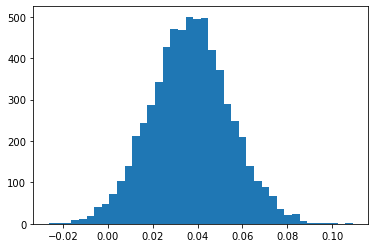

In [103]:
# Uncomment to load model_normal_A chains

# chain_samples_df_A = pd.read_csv("data/dogs_classification_hmc_samples_2A.csv")

x1 = np.abs(chain_samples_df_A["alpha"].to_numpy())
x2 = np.abs(chain_samples_df_A["beta"].to_numpy())
p = np.mean(x1<x2)
print(p)
_= plt.hist(x1-x2, bins=40)


So, the posterior evidence for _retention ability_ outweiging _learning abilty_ are not substantially different. Magnitute-wise, $\alpha, \beta$ are not different. Is this causing the `logits` to be very close 0, implying the `avoidance learning` is pretty much random? Or was this a simply modeling error.

### 9. Commentary

- Using `sigmoid` as link function fits the data better, compared to `exp` link. The `PiPC` and `PoPC` did follow conventional wisdom that posterior lies between data and prior.
- As a result of natural centering of the priors around zero, `pyro` sampler should not have problem.
- Still, the posterior was close to prior than to the original data; This could be due to inherent strucure of the modeling.
- We did notice slight negative posterior correlation between $\alpha$ and $\beta$. This is expected since the covariates themselves are negatively correlated; Therefore its an artifact of the model itself, not because of the data.
- Overall, it was a better model than the model with `exp` link function. However, we can not use `DIC` to compare the models with different link functions, because, fundamentally, the likelihoods are different. Then, the constant term in the DIC, which is often omitted when comparing models with same likelihoods, cannot be ignored
- The same data when fit using plain logistic regression, `statsmodel` detected a _perfect seperation_. This is not obvious in the Bayesian setting. Therefore, its always a good idea to run frequentist methods, wherever possible, to get a sense of the estimates.
- The posterior evidence was inconclusive for whether Dogs learn from their mistakes or not. It could be an artifact of the modeling choice.


### 10. Exercises

1. If two models, one with `exp` and another with `sigmoid` links are to be compared, argue why `DIC` cannot be used. If using DIC is problematic, which other metrics can be used?
2. Derive the expression for DIC in the above model.
3. As the number of trials increase, what happens to prior and posterior expectation of shocks, at the last trial? Does it decreases? If yes, at what rate?
4. Is flat prior same as non-informative prior in this case?
5. Show that the above model is a Bayesian logistic regression model and its equivalence is exact under improper priors.
6. When $|\frac{\alpha}{\beta}| \approx 1$, under what conditions, Dogs learning behaviour is random?